In [1]:
#bibliotecas
import nltk
import sys
import pathlib
import pandas as pd
import utilities as util
from IPython.core.display import display

pd.options.mode.chained_assignment = None
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import chisquare

## LIBRERIA

### Importación de librería personal

In [2]:
sys.path.append(pathlib.Path().parent.absolute())
#Importando módulo con funciones a utilizar
from funciones import *

## Lectura de dataset

In [3]:
#Lectura dataset
dfStations = pd.read_csv("estaciones-de-ecobici.csv")
dfTripsEne = pd.read_csv("viajes-2021-01.csv")
dfTripsFeb = pd.read_csv("viajes-2021-02.csv")
dfTripsMar = pd.read_csv("viajes-2021-03.csv")
dfTripsMar.rename(columns={'Ciclo_EstacionArribo':'Ciclo_Estacion_Arribo','Fecha Arribo': 'Fecha_Arribo','Hora Arribo':'Hora_Arribo'}, inplace = True)
frames = [dfTripsEne, dfTripsFeb, dfTripsMar]
dfTrips = pd.concat(frames)

# Etiquetado variables

In [4]:
 #continuas
station_c_feats = ['id','zipcode','altitude',
           'nearbystations_0','location_lat','location_lon',
           'nearbystations_1','nearbystations_2','nearbystations_3',
           'nearbystations_4','nearbystations_5']

trip_c_feats = ['Edad_Usuario','Bici','Ciclo_Estacion_Retiro',
                'Ciclo_Estacion_Arribo']

 #categóricas
station_v_feats = ['stationtype','districtname','districtcode']

trip_v_feats = ['Genero_Usuario']

 #Date
trip_d_feats = ['Fecha_Retiro','Hora_Retiro','Fecha_Arribo','Hora_Arribo']

 #Text
station_t_feats =['name','address','addressnumber','punto_geo']


#Re-etiquetando columnas
reEtiquetaVars(dfStations,'c',station_c_feats)
reEtiquetaVars(dfStations,'v',station_v_feats)
reEtiquetaVars(dfStations,'t',station_t_feats)

reEtiquetaVars(dfTrips,'c',trip_c_feats)
reEtiquetaVars(dfTrips,'v',trip_v_feats)
reEtiquetaVars(dfTrips,'d',trip_d_feats)

# Completitud

In [5]:
completitud(dfStations)

,columna,total,completitud
0,c_altitude,480,0.000000
1,c_nearbystations_4,477,0.625000
2,c_nearbystations_5,477,0.625000
3,c_nearbystations_3,444,7.500000
4,c_zipcode,149,68.958333
5,c_nearbystations_2,59,87.708333
6,c_nearbystations_1,17,96.458333
7,v_districtcode,1,99.791667
8,v_districtname,1,99.791667
9,c_id,0,100.000000


In [6]:
#ELiminamos columnas con missings mayor al 30%
dfStations =  dfStations.drop(columns=['c_altitude','c_nearbystations_4','c_nearbystations_5',
                       'c_nearbystations_3'])

In [7]:
completitud(dfTrips)

,columna,total,completitud
0,v_genero_usuario,105463,88.256771
1,c_edad_usuario,12,99.998664
2,c_bici,12,99.998664
3,c_ciclo_estacion_retiro,12,99.998664
4,d_fecha_retiro,12,99.998664
5,d_hora_retiro,12,99.998664
6,c_ciclo_estacion_arribo,0,100.000000
7,d_fecha_arribo,0,100.000000
8,d_hora_arribo,0,100.000000


## Consistencia

**Estaciones**

In [8]:
dfStations.dtypes

c_id                    int64
t_name                 object
t_address              object
t_addressnumber        object
c_zipcode             float64
v_districtcode         object
v_districtname         object
c_nearbystations_0      int64
c_location_lat        float64
c_location_lon        float64
v_stationtype          object
c_nearbystations_1    float64
c_nearbystations_2    float64
t_punto_geo            object
dtype: object

In [9]:
# ZIpcode mayor que 0
dfStations[dfStations['c_zipcode']<0].shape

(0, 14)

In [10]:
# valores de latitud
dfStations[dfStations["c_location_lat"].map(lambda x:x<=-90 or x>=90)].shape

(0, 14)

In [11]:
# valores de longitud
dfStations[dfStations["c_location_lon"].map(lambda x:x<=-180 or x>=180)].shape

(0, 14)

In [12]:
dfStations.describe()

,c_id,c_zipcode,c_nearbystations_0,c_location_lat,c_location_lon,c_nearbystations_1,c_nearbystations_2
count,480.000000,331.00000,480.000000,480.000000,480.000000,463.000000,421.000000
mean,240.500000,5621.23565,223.525000,19.409647,-99.170918,236.028078,255.000000
std,138.708327,2837.40564,137.106223,0.024425,0.015825,136.424064,135.737509
min,1.000000,3020.00000,1.000000,19.358270,-99.212845,3.000000,5.000000
25%,120.750000,3235.00000,106.250000,19.388946,-99.179836,118.000000,143.000000
50%,240.500000,3920.00000,206.500000,19.414846,-99.171091,235.000000,256.000000
75%,360.250000,6500.00000,341.250000,19.430649,-99.160599,357.500000,371.000000
max,480.000000,11800.00000,476.000000,19.446073,-99.130918,477.000000,479.000000


In [13]:
for col in dfStations.columns:
    display(dfStations[col].value_counts().to_frame())

,c_id
1,1
2,1
329,1
328,1
327,1
...,...
156,1
155,1
154,1
153,1


,t_name
31 HAMBURGO-INSURGENTES,1
111 GUILLERMO PRIETO-JOAQUÍN VELÁZQUEZ DE LEÓN,1
329 CALLE 13-AVENIDA 1,1
333 GEORGIA -CAROLINA,1
53 FERNANDO MONTES DE OCA-TULA,1
...,...
126 JALAPA-PUEBLA,1
418 GALICIA-ACTIPAN,1
123 CLAUDIO BERNARD-DR. LAVISTA,1
397 SAN LORENZO-GABRIEL MANCERA,1


,t_address
417 - Goya-Augusto Rodín,1
111 GUILLERMO PRIETO-JOAQUÍN VELÁZQUEZ DE LEÓN,1
341 - San Borja-Avenida Cuauhtemoc,1
022 - Reforma - Manchester,1
041 - Reforma - Av. de la República,1
...,...
204 - Temistocles-Homero,1
114 - Lucerna-Abraham González,1
450 RAMOS ARIZPE-PUENTE DE ALVARADO,1
015 - Reforma - Rio Mississippi,1


,t_addressnumber
S/N,478
s/n,1
S/R,1


,c_zipcode
6500.0,62
11510.0,45
3104.0,21
3100.0,19
3103.0,17
6100.0,16
3810.0,15
3020.0,15
6700.0,15
3310.0,11


,v_districtcode
1,75
POL,41
R-N,35
CEN,27
JUA,24
DVS,18
HIP,16
DVN,15
CUA,13
DVC,13


,v_districtname
Ampliación Granada,76
Polanco,41
Roma Norte,35
Centro,27
Juárez,24
Del Valle Sur,18
Hipódromo,16
Del Valle Norte,15
Del Valle Centro,13
Roma Sur,13


,c_nearbystations_0
176,9
196,5
33,5
301,4
70,4
...,...
217,1
2,1
226,1
230,1


,c_location_lat
19.442338,2
19.440839,2
19.396333,2
19.434183,2
19.427132,1
...,...
19.410733,1
19.436930,1
19.377968,1
19.413681,1


,c_location_lon
-99.173089,2
-99.181355,2
-99.158160,1
-99.193986,1
-99.154680,1
...,...
-99.191539,1
-99.158220,1
-99.201050,1
-99.169718,1


,v_stationtype
BIKE,350
"BIKE,TPV",102
ELECTRIC_BIKE,28


,c_nearbystations_1
147.0,5
20.0,4
474.0,4
230.0,4
335.0,4
...,...
97.0,1
328.0,1
55.0,1
125.0,1


,c_nearbystations_2
245.0,5
22.0,4
231.0,4
458.0,4
478.0,4
...,...
251.0,1
411.0,1
307.0,1
125.0,1


,t_punto_geo
"19.434183,-99.173089",2
"19.415121,-99.166661",1
"19.408841,-99.181692",1
"19.383063,-99.185858",1
"19.409893,-99.179544",1
...,...
"19.362139,-99.154974",1
"19.415192,-99.154837",1
"19.408736,-99.169913",1
"19.44111,-99.16164",1


In [14]:
#t_addressnumber solo contiene un valor(s/n)
dfStations = dfStations.drop(columns=['t_addressnumber'])

**Viajes**

In [15]:
dfStations.v_districtname = dfStations.v_districtname.fillna("Cuauhtémoc")
dfStations.v_districtcode = dfStations.v_districtcode.fillna("CUA")

In [16]:
dfStations.v_districtcode.value_counts()

1      75
POL    41
R-N    35
CEN    27
JUA    24
DVS    18
HIP    16
DVN    15
CUA    14
DVC    13
ROM    13
NAR    12
NAP    12
2      11
CON    10
SCA    10
ESC    10
INM     9
BUE     8
S-R     8
SMC     8
TLA     7
SPP     7
GPM     6
ANI     5
GRA     5
TAB     4
H-C     4
CDD     4
ACT     4
CHA     4
ISB     3
AMN     3
LEV     3
SMN     3
XOC     3
ACA     3
LCI     2
REE     2
EXI     2
NBU     2
LCH     2
IRR     2
LMV     2
AME     2
DOC     2
ANH     1
CUP     1
AMG     1
MDR     1
PON     1
Name: v_districtcode, dtype: int64

In [17]:
dfTrips


,v_genero_usuario,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,d_fecha_retiro,d_hora_retiro,c_ciclo_estacion_arribo,d_fecha_arribo,d_hora_arribo
0,M,32.0,7608.0,18.0,01/01/2021,07:05:04,143,01/01/2021,07:13:25
1,M,24.0,8324.0,76.0,01/01/2021,09:03:35,76,01/01/2021,09:08:08
2,F,35.0,6787.0,281.0,01/01/2021,09:22:41,61,01/01/2021,09:50:03
3,F,34.0,11875.0,405.0,01/01/2021,10:21:21,431,01/01/2021,10:27:16
4,M,26.0,8164.0,30.0,01/01/2021,11:52:38,126,01/01/2021,12:07:30
...,...,...,...,...,...,...,...,...,...
352480,M,37.0,9111.0,48.0,31/03/2021,11:50:33,3,31/03/2021,11:58:30
352481,F,48.0,10541.0,178.0,31/03/2021,11:55:07,166,31/03/2021,11:58:51
352482,M,26.0,3865.0,1.0,31/03/2021,11:51:10,120,31/03/2021,11:59:10
352483,F,48.0,11163.0,18.0,31/03/2021,11:57:32,25,31/03/2021,11:59:33


In [18]:
# valores de edad
dfTrips[dfTrips["c_edad_usuario"].map(lambda x:x<=0 or x>=100)].shape

(2, 9)

In [19]:
#Eliminar registros con edad inconsistente
dfTrips = dfTrips[~dfTrips["c_edad_usuario"].map(lambda x:x<=0 or x>=100)]
dfTrips.reset_index(drop=True,inplace=True)

In [20]:
dfTrips.describe()

,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,c_ciclo_estacion_arribo
count,898061.000000,898061.000000,898061.000000,898073.000000
mean,36.445846,9422.251159,188.942080,186.761484
std,10.657338,2547.082926,133.743238,132.717901
min,17.000000,775.000000,1.000000,1.000000
25%,29.000000,7883.000000,72.000000,71.000000
50%,34.000000,9478.000000,160.000000,157.000000
75%,42.000000,11215.000000,292.000000,288.000000
max,89.000000,15339.000000,480.000000,480.000000


In [21]:
for col in dfTrips.columns:
    display(dfTrips[col].value_counts().to_frame())

,v_genero_usuario
M,547336
F,245274


,c_edad_usuario
31.0,49091
32.0,47876
28.0,46515
30.0,46229
29.0,43302
...,...
81.0,91
17.0,44
89.0,31
82.0,25


,c_bici
11943.0,239
6809.0,234
10870.0,234
7006.0,234
9002.0,233
...,...
10684.0,1
7522.0,1
3927.0,1
7253.0,1


,c_ciclo_estacion_retiro
271.0,8908
1.0,7441
41.0,6933
182.0,5992
64.0,5661
...,...
411.0,188
410.0,164
399.0,129
446.0,118


,d_fecha_retiro
25/03/2021,13526
26/03/2021,13346
23/03/2021,13270
24/03/2021,13148
19/03/2021,12958
...,...
29/12/2020,1
18/12/2020,1
12/12/2020,1
16/12/2020,1


,d_hora_retiro
12:17:36,35
11:58:09,34
12:47:26,33
11:35:19,33
11:43:07,33
...,...
6:30:15,1
00:14:57,1
0:29:26,1
20:33:45,1


,c_ciclo_estacion_arribo
271,8311
1,7640
41,6510
266,6196
64,6133
...,...
314,180
213,176
399,175
446,169


,d_fecha_arribo
25/03/2021,13522
26/03/2021,13360
23/03/2021,13278
24/03/2021,13157
19/03/2021,12950
...,...
10/01/2021,5346
17/01/2021,5209
02/01/2021,4607
03/01/2021,4492


,d_hora_arribo
09:02:53,35
09:01:51,34
12:53:43,33
09:03:17,33
10:07:00,32
...,...
23:31:21,1
00:20:52,1
6:42:01,1
0:36:53,1


In [22]:
#Establecemos formatos y tipos de datos
dfTrips['c_edad_usuario'] = dfTrips['c_edad_usuario'].astype('Int64')
dfTrips['c_bici'] = dfTrips['c_bici'].astype('Int64')
dfTrips['c_ciclo_estacion_retiro'] = dfTrips['c_ciclo_estacion_retiro'].astype('Int64')
dfTrips['d_fecha_retiro'] = pd.to_datetime(dfTrips['d_fecha_retiro'])
dfTrips['c_ciclo_estacion_arribo'] = dfTrips['c_ciclo_estacion_arribo'].astype('Int64')
dfTrips['d_fecha_arribo'] = pd.to_datetime(dfTrips['d_fecha_arribo'])

# Normalizacion

In [23]:
station_v_feats = dfStations.filter(like='v_')
for col in station_v_feats:
    display(dfStations[col].value_counts(True).reset_index())

,index,v_districtcode
0,1,0.156250
1,POL,0.085417
2,R-N,0.072917
3,CEN,0.056250
4,JUA,0.050000
5,DVS,0.037500
6,HIP,0.033333
7,DVN,0.031250
8,CUA,0.029167
9,DVC,0.027083


,index,v_districtname
0,Ampliación Granada,0.158333
1,Polanco,0.085417
2,Roma Norte,0.072917
3,Centro,0.056250
4,Juárez,0.050000
5,Del Valle Sur,0.037500
6,Hipódromo,0.033333
7,Del Valle Norte,0.031250
8,Cuauhtémoc,0.029167
9,Del Valle Centro,0.027083


,index,v_stationtype
0,BIKE,0.729167
1,"BIKE,TPV",0.212500
2,ELECTRIC_BIKE,0.058333


In [24]:
trip_v_feats = dfTrips.filter(like='v_')
for col in trip_v_feats:
    display(dfTrips[col].value_counts(True).reset_index())

,index,v_genero_usuario
0,M,0.690549
1,F,0.309451


# Analisis Exploratorio de Datos 

 **Distribución de estaciones por tipo**

In [25]:
graph_pie_count(dfStations,'v_stationtype','Tipos')

 **Distribución de estaciones por distrito**

In [26]:
graph_pie_count(dfStations,'v_districtname','Generacion')

 **Distribución de usuarios por género**

In [27]:
graph_pie_count(dfTrips,'v_genero_usuario','status')

In [28]:
dfTrips['c_edad_usuario'] = dfTrips['c_edad_usuario'].astype('float')

 **Histograma de edades de los usuarios**

In [29]:
graph_histogram(dfTrips,'c_edad_usuario',100,'TTitle','','')

### Correlación del data frame

In [30]:
dfStations.corr().style.background_gradient(cmap='coolwarm')

,c_id,c_zipcode,c_nearbystations_0,c_location_lat,c_location_lon,c_nearbystations_1,c_nearbystations_2
c_id,1.000000,-0.495970,0.942618,-0.526236,-0.299271,0.947905,0.955269
c_zipcode,-0.495970,1.000000,-0.503959,0.795294,-0.397970,-0.481894,-0.472345
c_nearbystations_0,0.942618,-0.503959,1.000000,-0.598774,-0.265802,0.979522,0.943610
c_location_lat,-0.526236,0.795294,-0.598774,1.000000,-0.037665,-0.583466,-0.541418
c_location_lon,-0.299271,-0.397970,-0.265802,-0.037665,1.000000,-0.265826,-0.261678
c_nearbystations_1,0.947905,-0.481894,0.979522,-0.583466,-0.265826,1.000000,0.963812
c_nearbystations_2,0.955269,-0.472345,0.943610,-0.541418,-0.261678,0.963812,1.000000


In [31]:
dfTrips.corr().style.background_gradient(cmap='coolwarm')

,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,c_ciclo_estacion_arribo
c_edad_usuario,1.000000,-0.001537,-0.039198,-0.036088
c_bici,-0.001537,1.000000,0.071814,0.072340
c_ciclo_estacion_retiro,-0.039198,0.071814,1.000000,0.478976
c_ciclo_estacion_arribo,-0.036088,0.072340,0.478976,1.000000


# Outliers

**Estaciones**

In [32]:
#Bucando outliers
feats=list(dfStations.filter(like="c_").columns)
outliers=search_outliers(dfStations,feats)
outliers

,features,n_outliers_IQR,n_outliers_Percentil,n_outliers_Z_Score,n_outliers_IQR_%,n_outliers_Percentil_%,n_outliers_Z_Score_%,total_outliers,%_outliers,indices
0,c_id,0,48,0,0.00,10.00,0.0,0,0.00,[]
1,c_zipcode,49,19,0,10.21,3.96,0.0,0,0.00,[]
2,c_nearbystations_0,0,48,0,0.00,10.00,0.0,0,0.00,[]
3,c_location_lat,0,47,0,0.00,9.79,0.0,0,0.00,[]
4,c_location_lon,4,48,0,0.83,10.00,0.0,0,0.00,[]
5,c_nearbystations_1,0,48,0,0.00,10.00,0.0,4,0.83,"[72, 246, 470, 367]"
6,c_nearbystations_2,0,41,0,0.00,8.54,0.0,4,0.83,"[313, 157, 398, 377]"


In [33]:
dfStations.shape

(480, 13)

In [34]:
#Eliminación outlier stations
indices=list(outliers[outliers["features"]=="c_nearbystations_1"]["indices"].values)[0]
indices.extend(list(outliers[outliers["features"]=="c_nearbystations_2"]["indices"].values)[0])
dfStations = dfStations[~dfStations.index.isin(indices)]
dfStations.shape

(472, 13)

In [35]:
dfTrips['c_edad_usuario'] = dfTrips['c_edad_usuario'].astype('float')
dfTrips['c_bici'] = dfTrips['c_bici'].astype('float')
dfTrips['c_ciclo_estacion_retiro'] = dfTrips['c_ciclo_estacion_retiro'].astype('float')
dfTrips['c_ciclo_estacion_arribo'] = dfTrips['c_ciclo_estacion_arribo'].astype('float')

**Viajes**

In [36]:
#Bucando outliers
feats=list(dfTrips.filter(like="c_").columns)
outliers=search_outliers(dfTrips,feats)
outliers

,features,n_outliers_IQR,n_outliers_Percentil,n_outliers_Z_Score,n_outliers_IQR_%,n_outliers_Percentil_%,n_outliers_Z_Score_%,total_outliers,%_outliers,indices
0,c_edad_usuario,25703,74374,7531,2.86,8.28,0.84,0,0.00,[]
1,c_bici,12353,89644,4179,1.38,9.98,0.47,0,0.00,[]
2,c_ciclo_estacion_retiro,0,87847,0,0.00,9.78,0.00,25703,2.86,"[393216, 5, 393229, 19, 262171, 29, 131101, 13..."
3,c_ciclo_estacion_arribo,0,89632,0,0.00,9.98,0.00,12353,1.38,"[491521, 688132, 98309, 393220, 65542, 524298,..."


In [37]:
dfTrips.shape

(898073, 9)

In [38]:
# ELiminación outliers Trips
indices=list(outliers[outliers["features"]=="c_ciclo_estacion_retiro"]["indices"].values)[0]
indices.extend(list(outliers[outliers["features"]=="c_ciclo_estacion_arribo"]["indices"].values)[0])
dfTrips = dfTrips[~dfTrips.index.isin(indices)]
dfTrips.shape

(860355, 9)

# Imputación de valores ausentes

In [39]:
## Imputación de valores

In [40]:
completitud(dfTrips)

,columna,total,completitud
0,v_genero_usuario,102904,88.039356
1,c_edad_usuario,12,99.998605
2,c_bici,12,99.998605
3,c_ciclo_estacion_retiro,12,99.998605
4,d_fecha_retiro,12,99.998605
5,d_hora_retiro,12,99.998605
6,c_ciclo_estacion_arribo,0,100.000000
7,d_fecha_arribo,0,100.000000
8,d_hora_arribo,0,100.000000


In [41]:
completitud(dfStations)

,columna,total,completitud
0,c_zipcode,146,69.067797
1,c_nearbystations_2,58,87.711864
2,c_nearbystations_1,16,96.610169
3,c_id,0,100.000000
4,t_name,0,100.000000
5,t_address,0,100.000000
6,v_districtcode,0,100.000000
7,v_districtname,0,100.000000
8,c_nearbystations_0,0,100.000000
9,c_location_lat,0,100.000000


In [42]:
def chi_square(df,col,valor_miss):
    x_i=df[col].fillna(valor_miss).value_counts()
    k=x_i.sum()
    p_i=df[col].dropna().value_counts(1)
    m_i=k*p_i
    chi=chisquare(f_obs=x_i,f_exp=m_i)
    p_val=chi.pvalue
    alpha=0.05
    if p_val<alpha:
        print("Rechazamos HO(La porporción de categorias es la misma que la general)")
    else:
        print("Aceptamos HO(La porporción de categorias es la misma que la general)")

In [43]:
# Revisamos si podemos imputar las variables c_SCHEDULED_TIME" por medio de la moda
a=dfTrips["d_hora_retiro"].mode()[0]
b=dfTrips["d_fecha_retiro"].mode()[0]
c=dfTrips["c_ciclo_estacion_retiro"].mode()[0]
d=dfTrips["c_bici"].mode()[0]
e=dfTrips["c_edad_usuario"].mode()[0]
f=dfTrips["v_genero_usuario"].mode()[0]

In [44]:
chi_square(dfTrips,"d_hora_retiro",a)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [45]:
chi_square(dfTrips,"d_fecha_retiro",b)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [46]:
chi_square(dfTrips,"c_ciclo_estacion_retiro",c)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [47]:
chi_square(dfTrips,"c_bici",d)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [48]:
chi_square(dfTrips,"c_edad_usuario",e)

Aceptamos HO(La porporción de categorias es la misma que la general)


In [49]:
chi_square(dfTrips,"v_genero_usuario",f)

Rechazamos HO(La porporción de categorias es la misma que la general)


In [50]:
dfTrips["d_hora_retiro"]=dfTrips["d_hora_retiro"].fillna(a)
dfTrips["d_fecha_retiro"]=dfTrips["d_fecha_retiro"].fillna(b)
dfTrips["c_ciclo_estacion_retiro"]=dfTrips["c_ciclo_estacion_retiro"].fillna(c)
dfTrips["c_bici"]=dfTrips["c_bici"].fillna(d)
dfTrips["c_edad_usuario"]=dfTrips["c_edad_usuario"].fillna(e)

In [51]:
dfStations.c_zipcode = dfStations.c_zipcode.fillna(0)
dfStations.c_nearbystations_0 =dfStations.c_nearbystations_0.fillna(0)
dfStations.c_nearbystations_1= dfStations.c_nearbystations_1.fillna(0)
dfStations.c_nearbystations_2 = dfStations.c_nearbystations_2.fillna(0)






In [52]:
# Dado que no se puede imputar la variable genero_usuario  con la moda cambiamos los valores ausentes por "otro"

In [53]:
dfTrips["v_genero_usuario"]=dfTrips["v_genero_usuario"].replace({np.nan:"otro"})

# Ingenieria de variables

In [93]:
# Agregar variable que especifique en que momento del día se 
# realizó el viaje (Madrugada,Dia,Tarde,Noche)

dfTrips['d_hora_retiro_2'] = pd.to_datetime(dfTrips['d_hora_retiro']).dt.hour
dfTrips['v_moment_of_day'] = dfTrips['d_hora_retiro_2'].map(lambda x: 'madrugada' if (x>=0.0 and x<6.0) else 'dia' if (x>=6.0 and x<12.0) else 'tarde' if (x>=12.0 and x<18.0) else 'noche')
dfTrips = dfTrips.drop(columns='d_hora_retiro_2')

In [94]:
dfStations

,c_id,t_name,t_address,c_zipcode,v_districtcode,v_districtname,c_nearbystations_0,c_location_lat,c_location_lon,v_stationtype,c_nearbystations_1,c_nearbystations_2,t_punto_geo
0,86,SULLIVAN-INSURGENTES,Sullivan-Insurgentes,6470.0,1,Ampliación Granada,12,19.432378,-99.159077,"BIKE,TPV",20.0,0.0,"19.432378,-99.159077"
1,250,DARWIN-MARIANO ESCOBEDO,Darwin-Mariano Escobedo,11510.0,1,Ampliación Granada,239,19.429057,-99.179660,"BIKE,TPV",249.0,252.0,"19.429057,-99.17966"
2,273,LUIS DONALDO COLOSIO-AV. CENTRAL,Luis Donaldo ColosioAv. Jesus Garcia,0.0,1,Ampliación Granada,176,19.442707,-99.152956,BIKE,268.0,274.0,"19.442707,-99.152956"
3,278,MIER Y PESADO-OBRERO MUNDIAL,Mier Y Pesado-Obrero Mundial,3103.0,1,Ampliación Granada,164,19.400710,-99.163831,BIKE,279.0,282.0,"19.40071,-99.163831"
4,305,AVENIDA DEL PARQUE-ARIZONA,Avenida Del Parque-Arizona,3810.0,1,Ampliación Granada,304,19.394693,-99.175531,"BIKE,TPV",306.0,307.0,"19.394693,-99.175531"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,156,TEPIC-AMENALCO,Tepic-Amenalco,0.0,ROM,Roma Sur,153,19.407121,-99.162202,BIKE,155.0,162.0,"19.407121,-99.162202"
476,162,TEHUANTEPEC-MEDELLÍN,Tehuantepec-Medellín,0.0,ROM,Roma Sur,161,19.404907,-99.162485,BIKE,165.0,0.0,"19.404907,-99.162485"
477,410,PROLONGACIÓN TAJÍN-PROLONGACIÓN REPÚBLICAS,Prolongación Tajín-Prolongación Repúblicas,3310.0,SCA,Santa Cruz Atoyac,407,19.365640,-99.158063,BIKE,408.0,409.0,"19.36564,-99.158063"
478,411,PARROQUIA-AVENIDA MÉXICO-COYOACAN,Parroquia-Avenida México-Coyoacan,3310.0,SCA,Santa Cruz Atoyac,412,19.367864,-99.163626,BIKE,425.0,427.0,"19.367864,-99.163626"


In [95]:
# limpieza variables de texto para  retirar el id y tener solo el nombre y la dirección de la estación

dfStations["t_name"] = dfStations.apply(lambda a: a["t_name"].replace(str(a.c_id), ""), axis=1)
dfStations["t_address"] = dfStations.apply(lambda a: a["t_address"].replace(str(a.c_id)+" -", ""), axis=1)
dfStations["t_address"] = dfStations.apply(lambda a: a["t_address"].replace(str(a.c_id), ""), axis=1)
dfStations["t_address"] = dfStations.apply(lambda a: a["t_address"].replace("0", ""), axis=1)
dfStations["t_address"] = dfStations.apply(lambda a: a["t_address"].replace(" - ", ""), axis=1)

In [96]:
dfStations

,c_id,t_name,t_address,c_zipcode,v_districtcode,v_districtname,c_nearbystations_0,c_location_lat,c_location_lon,v_stationtype,c_nearbystations_1,c_nearbystations_2,t_punto_geo
0,86,SULLIVAN-INSURGENTES,Sullivan-Insurgentes,6470.0,1,Ampliación Granada,12,19.432378,-99.159077,"BIKE,TPV",20.0,0.0,"19.432378,-99.159077"
1,250,DARWIN-MARIANO ESCOBEDO,Darwin-Mariano Escobedo,11510.0,1,Ampliación Granada,239,19.429057,-99.179660,"BIKE,TPV",249.0,252.0,"19.429057,-99.17966"
2,273,LUIS DONALDO COLOSIO-AV. CENTRAL,Luis Donaldo ColosioAv. Jesus Garcia,0.0,1,Ampliación Granada,176,19.442707,-99.152956,BIKE,268.0,274.0,"19.442707,-99.152956"
3,278,MIER Y PESADO-OBRERO MUNDIAL,Mier Y Pesado-Obrero Mundial,3103.0,1,Ampliación Granada,164,19.400710,-99.163831,BIKE,279.0,282.0,"19.40071,-99.163831"
4,305,AVENIDA DEL PARQUE-ARIZONA,Avenida Del Parque-Arizona,3810.0,1,Ampliación Granada,304,19.394693,-99.175531,"BIKE,TPV",306.0,307.0,"19.394693,-99.175531"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,156,TEPIC-AMENALCO,Tepic-Amenalco,0.0,ROM,Roma Sur,153,19.407121,-99.162202,BIKE,155.0,162.0,"19.407121,-99.162202"
476,162,TEHUANTEPEC-MEDELLÍN,Tehuantepec-Medellín,0.0,ROM,Roma Sur,161,19.404907,-99.162485,BIKE,165.0,0.0,"19.404907,-99.162485"
477,410,PROLONGACIÓN TAJÍN-PROLONGACIÓN REPÚBLICAS,Prolongación Tajín-Prolongación Repúblicas,3310.0,SCA,Santa Cruz Atoyac,407,19.365640,-99.158063,BIKE,408.0,409.0,"19.36564,-99.158063"
478,411,PARROQUIA-AVENIDA MÉXICO-COYOACAN,Parroquia-Avenida México-Coyoacan,3310.0,SCA,Santa Cruz Atoyac,412,19.367864,-99.163626,BIKE,425.0,427.0,"19.367864,-99.163626"


In [97]:
dfTrips

,v_genero_usuario,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,d_fecha_retiro,d_hora_retiro,c_ciclo_estacion_arribo,d_fecha_arribo,d_hora_arribo,v_moment_of_day
0,M,32.0,7608.0,18,2021-01-01,07:05:04,143,2021-01-01,07:13:25,dia
1,M,24.0,8324.0,76,2021-01-01,09:03:35,76,2021-01-01,09:08:08,dia
2,F,35.0,6787.0,281,2021-01-01,09:22:41,61,2021-01-01,09:50:03,dia
3,F,34.0,11875.0,405,2021-01-01,10:21:21,431,2021-01-01,10:27:16,dia
4,M,26.0,8164.0,30,2021-01-01,11:52:38,126,2021-01-01,12:07:30,dia
...,...,...,...,...,...,...,...,...,...,...
898068,M,37.0,9111.0,48,2021-03-31,11:50:33,3,2021-03-31,11:58:30,dia
898069,F,48.0,10541.0,178,2021-03-31,11:55:07,166,2021-03-31,11:58:51,dia
898070,M,26.0,3865.0,1,2021-03-31,11:51:10,120,2021-03-31,11:59:10,dia
898071,F,48.0,11163.0,18,2021-03-31,11:57:32,25,2021-03-31,11:59:33,dia


In [98]:
dfTrips.c_ciclo_estacion_retiro = dfTrips.c_ciclo_estacion_retiro.fillna(0)
dfTrips.c_ciclo_estacion_arribo = dfTrips.c_ciclo_estacion_arribo.fillna(0)
dfTrips.c_ciclo_estacion_retiro = list(map(lambda eco :int(eco),dfTrips.c_ciclo_estacion_retiro))
dfTrips.c_ciclo_estacion_arribo = list(map(lambda eco :int(eco),dfTrips.c_ciclo_estacion_arribo))

In [99]:
dfTrips.head()

,v_genero_usuario,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,d_fecha_retiro,d_hora_retiro,c_ciclo_estacion_arribo,d_fecha_arribo,d_hora_arribo,v_moment_of_day
0,M,32.0,7608.0,18,2021-01-01,07:05:04,143,2021-01-01,07:13:25,dia
1,M,24.0,8324.0,76,2021-01-01,09:03:35,76,2021-01-01,09:08:08,dia
2,F,35.0,6787.0,281,2021-01-01,09:22:41,61,2021-01-01,09:50:03,dia
3,F,34.0,11875.0,405,2021-01-01,10:21:21,431,2021-01-01,10:27:16,dia
4,M,26.0,8164.0,30,2021-01-01,11:52:38,126,2021-01-01,12:07:30,dia


In [100]:
dfStations

,c_id,t_name,t_address,c_zipcode,v_districtcode,v_districtname,c_nearbystations_0,c_location_lat,c_location_lon,v_stationtype,c_nearbystations_1,c_nearbystations_2,t_punto_geo
0,86,SULLIVAN-INSURGENTES,Sullivan-Insurgentes,6470.0,1,Ampliación Granada,12,19.432378,-99.159077,"BIKE,TPV",20.0,0.0,"19.432378,-99.159077"
1,250,DARWIN-MARIANO ESCOBEDO,Darwin-Mariano Escobedo,11510.0,1,Ampliación Granada,239,19.429057,-99.179660,"BIKE,TPV",249.0,252.0,"19.429057,-99.17966"
2,273,LUIS DONALDO COLOSIO-AV. CENTRAL,Luis Donaldo ColosioAv. Jesus Garcia,0.0,1,Ampliación Granada,176,19.442707,-99.152956,BIKE,268.0,274.0,"19.442707,-99.152956"
3,278,MIER Y PESADO-OBRERO MUNDIAL,Mier Y Pesado-Obrero Mundial,3103.0,1,Ampliación Granada,164,19.400710,-99.163831,BIKE,279.0,282.0,"19.40071,-99.163831"
4,305,AVENIDA DEL PARQUE-ARIZONA,Avenida Del Parque-Arizona,3810.0,1,Ampliación Granada,304,19.394693,-99.175531,"BIKE,TPV",306.0,307.0,"19.394693,-99.175531"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,156,TEPIC-AMENALCO,Tepic-Amenalco,0.0,ROM,Roma Sur,153,19.407121,-99.162202,BIKE,155.0,162.0,"19.407121,-99.162202"
476,162,TEHUANTEPEC-MEDELLÍN,Tehuantepec-Medellín,0.0,ROM,Roma Sur,161,19.404907,-99.162485,BIKE,165.0,0.0,"19.404907,-99.162485"
477,410,PROLONGACIÓN TAJÍN-PROLONGACIÓN REPÚBLICAS,Prolongación Tajín-Prolongación Repúblicas,3310.0,SCA,Santa Cruz Atoyac,407,19.365640,-99.158063,BIKE,408.0,409.0,"19.36564,-99.158063"
478,411,PARROQUIA-AVENIDA MÉXICO-COYOACAN,Parroquia-Avenida México-Coyoacan,3310.0,SCA,Santa Cruz Atoyac,412,19.367864,-99.163626,BIKE,425.0,427.0,"19.367864,-99.163626"


In [101]:

estaciones_retiro_aux = dfStations.copy()
estaciones_arribo_aux = dfStations.copy()
util.renameHeaders(estaciones_retiro_aux, estaciones_retiro_aux.columns,"retiro_")
util.renameHeaders(estaciones_arribo_aux, estaciones_arribo_aux.columns,"arribo_")

,arribo_c_id,arribo_t_name,arribo_t_address,arribo_c_zipcode,arribo_v_districtcode,arribo_v_districtname,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_v_stationtype,arribo_c_nearbystations_1,arribo_c_nearbystations_2,arribo_t_punto_geo
0,86,SULLIVAN-INSURGENTES,Sullivan-Insurgentes,6470.0,1,Ampliación Granada,12,19.432378,-99.159077,"BIKE,TPV",20.0,0.0,"19.432378,-99.159077"
1,250,DARWIN-MARIANO ESCOBEDO,Darwin-Mariano Escobedo,11510.0,1,Ampliación Granada,239,19.429057,-99.179660,"BIKE,TPV",249.0,252.0,"19.429057,-99.17966"
2,273,LUIS DONALDO COLOSIO-AV. CENTRAL,Luis Donaldo ColosioAv. Jesus Garcia,0.0,1,Ampliación Granada,176,19.442707,-99.152956,BIKE,268.0,274.0,"19.442707,-99.152956"
3,278,MIER Y PESADO-OBRERO MUNDIAL,Mier Y Pesado-Obrero Mundial,3103.0,1,Ampliación Granada,164,19.400710,-99.163831,BIKE,279.0,282.0,"19.40071,-99.163831"
4,305,AVENIDA DEL PARQUE-ARIZONA,Avenida Del Parque-Arizona,3810.0,1,Ampliación Granada,304,19.394693,-99.175531,"BIKE,TPV",306.0,307.0,"19.394693,-99.175531"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,156,TEPIC-AMENALCO,Tepic-Amenalco,0.0,ROM,Roma Sur,153,19.407121,-99.162202,BIKE,155.0,162.0,"19.407121,-99.162202"
476,162,TEHUANTEPEC-MEDELLÍN,Tehuantepec-Medellín,0.0,ROM,Roma Sur,161,19.404907,-99.162485,BIKE,165.0,0.0,"19.404907,-99.162485"
477,410,PROLONGACIÓN TAJÍN-PROLONGACIÓN REPÚBLICAS,Prolongación Tajín-Prolongación Repúblicas,3310.0,SCA,Santa Cruz Atoyac,407,19.365640,-99.158063,BIKE,408.0,409.0,"19.36564,-99.158063"
478,411,PARROQUIA-AVENIDA MÉXICO-COYOACAN,Parroquia-Avenida México-Coyoacan,3310.0,SCA,Santa Cruz Atoyac,412,19.367864,-99.163626,BIKE,425.0,427.0,"19.367864,-99.163626"


In [102]:
estaciones_arribo_aux

,arribo_c_id,arribo_t_name,arribo_t_address,arribo_c_zipcode,arribo_v_districtcode,arribo_v_districtname,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_v_stationtype,arribo_c_nearbystations_1,arribo_c_nearbystations_2,arribo_t_punto_geo
0,86,SULLIVAN-INSURGENTES,Sullivan-Insurgentes,6470.0,1,Ampliación Granada,12,19.432378,-99.159077,"BIKE,TPV",20.0,0.0,"19.432378,-99.159077"
1,250,DARWIN-MARIANO ESCOBEDO,Darwin-Mariano Escobedo,11510.0,1,Ampliación Granada,239,19.429057,-99.179660,"BIKE,TPV",249.0,252.0,"19.429057,-99.17966"
2,273,LUIS DONALDO COLOSIO-AV. CENTRAL,Luis Donaldo ColosioAv. Jesus Garcia,0.0,1,Ampliación Granada,176,19.442707,-99.152956,BIKE,268.0,274.0,"19.442707,-99.152956"
3,278,MIER Y PESADO-OBRERO MUNDIAL,Mier Y Pesado-Obrero Mundial,3103.0,1,Ampliación Granada,164,19.400710,-99.163831,BIKE,279.0,282.0,"19.40071,-99.163831"
4,305,AVENIDA DEL PARQUE-ARIZONA,Avenida Del Parque-Arizona,3810.0,1,Ampliación Granada,304,19.394693,-99.175531,"BIKE,TPV",306.0,307.0,"19.394693,-99.175531"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,156,TEPIC-AMENALCO,Tepic-Amenalco,0.0,ROM,Roma Sur,153,19.407121,-99.162202,BIKE,155.0,162.0,"19.407121,-99.162202"
476,162,TEHUANTEPEC-MEDELLÍN,Tehuantepec-Medellín,0.0,ROM,Roma Sur,161,19.404907,-99.162485,BIKE,165.0,0.0,"19.404907,-99.162485"
477,410,PROLONGACIÓN TAJÍN-PROLONGACIÓN REPÚBLICAS,Prolongación Tajín-Prolongación Repúblicas,3310.0,SCA,Santa Cruz Atoyac,407,19.365640,-99.158063,BIKE,408.0,409.0,"19.36564,-99.158063"
478,411,PARROQUIA-AVENIDA MÉXICO-COYOACAN,Parroquia-Avenida México-Coyoacan,3310.0,SCA,Santa Cruz Atoyac,412,19.367864,-99.163626,BIKE,425.0,427.0,"19.367864,-99.163626"


In [103]:
dfTrips=pd.merge(dfTrips, estaciones_retiro_aux, left_on="c_ciclo_estacion_retiro",right_on="retiro_c_id", how='left')
dfTrips=pd.merge(dfTrips, estaciones_arribo_aux, left_on="c_ciclo_estacion_arribo",right_on="arribo_c_id", how='left')

## Tabla mergeda con las estacion es de arribo y retiro ...N

In [104]:
dfTrips

,v_genero_usuario,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,d_fecha_retiro,d_hora_retiro,c_ciclo_estacion_arribo,d_fecha_arribo,d_hora_arribo,v_moment_of_day,retiro_c_id,retiro_t_name,retiro_t_address,retiro_c_zipcode,retiro_v_districtcode,retiro_v_districtname,retiro_c_nearbystations_0,retiro_c_location_lat,retiro_c_location_lon,retiro_v_stationtype,retiro_c_nearbystations_1,retiro_c_nearbystations_2,retiro_t_punto_geo,arribo_c_id,arribo_t_name,arribo_t_address,arribo_c_zipcode,arribo_v_districtcode,arribo_v_districtname,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_v_stationtype,arribo_c_nearbystations_1,arribo_c_nearbystations_2,arribo_t_punto_geo
0,M,32.0,7608.0,18,2021-01-01,07:05:04,143,2021-01-01,07:13:25,dia,18.0,REFORMA-RIO RHIN,ReformaRío Rhin,6500.0,CUA,Cuauhtémoc,17.0,19.428880,-99.164176,"BIKE,TPV",25.0,0.0,"19.42888,-99.164176",143.0,CÓRDOBA-SAN LUIS POTOSÍ,Córdoba-San Luis Potosí,0.0,R-N,Roma Norte,141.0,19.414303,-99.157542,BIKE,144.0,147.0,"19.414303,-99.157542"
1,M,24.0,8324.0,76,2021-01-01,09:03:35,76,2021-01-01,09:08:08,dia,76.0,CHILPANCINGO-CAMPECHE,ChilpancingoCampeche,6100.0,HIP,Hipódromo,70.0,19.408736,-99.169913,BIKE,71.0,74.0,"19.408736,-99.169913",76.0,CHILPANCINGO-CAMPECHE,ChilpancingoCampeche,6100.0,HIP,Hipódromo,70.0,19.408736,-99.169913,BIKE,71.0,74.0,"19.408736,-99.169913"
2,F,35.0,6787.0,281,2021-01-01,09:22:41,61,2021-01-01,09:50:03,dia,281.0,PITÁGORAS-LA MORENA,Pitágoras-La Morena,3020.0,NAR,Narvarte Poniente,276.0,19.398532,-99.157308,BIKE,280.0,295.0,"19.398532,-99.157308",61.0,AVENIDA MEXICO-SONORA,Avenida MéxicoSonora,6100.0,HIP,Hipódromo,59.0,19.413742,-99.169525,"BIKE,TPV",63.0,64.0,"19.413742,-99.169525"
3,F,34.0,11875.0,405,2021-01-01,10:21:21,431,2021-01-01,10:27:16,dia,405.0,DIVISIÓN DEL NORTE-MUNICIPIO LIBRE,División Del Norte-Municipio Libre,3303.0,PON,Portales Norte,402.0,19.370619,-99.156626,BIKE,403.0,404.0,"19.370619,-99.156626",431.0,BRUNO TRAVEN-PAZ MONTES DE OCA,Bruno Traven-Paz Montes De Oca,3340.0,GPM,General Pedro Maria Anaya,428.0,19.361450,-99.158220,BIKE,429.0,430.0,"19.36145,-99.15822"
4,M,26.0,8164.0,30,2021-01-01,11:52:38,126,2021-01-01,12:07:30,dia,30.0,HAMBURGO-GENOVA,HamburgoGenova,6500.0,JUA,Juárez,26.0,19.426442,-99.164323,"BIKE,TPV",34.0,35.0,"19.426442,-99.164323",126.0,JALAPA-PUEBLA,Jalapa-Puebla,0.0,R-N,Roma Norte,121.0,19.422288,-99.162138,BIKE,128.0,129.0,"19.422288,-99.162138"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
860350,M,37.0,9111.0,48,2021-03-31,11:50:33,3,2021-03-31,11:58:30,dia,48.0,INDEPENDENCIA-AZUETA,IndependenciaAzueta,6700.0,CEN,Centro,43.0,19.433686,-99.146557,BIKE,82.0,0.0,"19.433686,-99.146557",3.0,REFORMA-INSURGENTES,ReformaInsurgentes,6500.0,1,Ampliación Granada,8.0,19.431655,-99.158668,"BIKE,TPV",20.0,86.0,"19.431655,-99.158668"
860351,F,48.0,10541.0,178,2021-03-31,11:55:07,166,2021-03-31,11:58:51,dia,178.0,TAMAULIPAS-FRANCISCO MURGUÍA,Tamaulipas-Francisco Murguía,0.0,H-C,Hipódromo Condesa,166.0,19.406833,-99.180457,"BIKE,TPV",167.0,177.0,"19.406833,-99.180457",166.0,PROGRESO-CDA. ANTONIO MACEO,Progreso-Cda. Antonio Maceo,0.0,ESC,Escandón,170.0,19.406069,-99.183549,BIKE,172.0,181.0,"19.406069,-99.183549"
860352,M,26.0,3865.0,1,2021-03-31,11:51:10,120,2021-03-31,11:59:10,dia,1.0,RIO SENA-RIO BALSAS,Río Sena-Río Balsas,6500.0,CUA,Cuauhtémoc,3.0,19.433571,-99.167809,"BIKE,TPV",8.0,85.0,"19.4335714,-99.1678091",120.0,MARSELLA-NAPOLES,Marsella-Nápoles,6500.0,JUA,Juárez,117.0,19.425437,-99.159458,BIKE,118.0,121.0,"19.425437,-99.159458"
860353,F,48.0,11163.0,18,2021-03-31,11:57:32,25,2021-03-31,11:59:33,dia,18.0,REFORMA-RIO RHIN,ReformaRío Rhin,6500.0,CUA,Cuauhtémoc,17.0,19.428880,-99.164176,"BIKE,TPV",25.0,0.0,"19.42888,-99.164176",25.0,REFORMA-ESTOCOLMO,ReformaEstocolmo,6500.0,JUA,Juárez,17.0,19.427317,-99.166662,BIKE,18.0,0.0,"19.427317,-99.166662"


In [105]:
completitud(dfTrips)

,columna,total,completitud
0,retiro_c_location_lat,10973,98.724596
1,retiro_c_nearbystations_1,10973,98.724596
2,retiro_v_stationtype,10973,98.724596
3,retiro_c_location_lon,10973,98.724596
4,retiro_c_nearbystations_0,10973,98.724596
5,retiro_v_districtname,10973,98.724596
6,retiro_v_districtcode,10973,98.724596
7,retiro_c_zipcode,10973,98.724596
8,retiro_t_address,10973,98.724596
9,retiro_c_nearbystations_2,10973,98.724596


In [106]:
dfTrips = dfTrips.dropna(subset=["arribo_t_name"])
dfTrips = dfTrips.dropna(subset=["retiro_v_districtname"])

In [107]:
completitud(dfTrips)

,columna,total,completitud
0,v_genero_usuario,0,100.0
1,retiro_c_nearbystations_1,0,100.0
2,retiro_c_nearbystations_2,0,100.0
3,retiro_t_punto_geo,0,100.0
4,arribo_c_id,0,100.0
5,arribo_t_name,0,100.0
6,arribo_t_address,0,100.0
7,retiro_v_stationtype,0,100.0
8,arribo_c_zipcode,0,100.0
9,arribo_v_districtname,0,100.0


In [108]:
## Ingenieria de variables
# Agregar variable que especifique en que momento del día se realizó el viaje (Madrugada,Dia,Tarde,Noche)
# Agregar variables que indiquen tiempo al separar la fecha (Mes, Día de la semana(Lun,Mar,Mier...))
# Agregar variable que indique la duración del viaje
# Agregar variable que indique el total de viajes por estacion

# Tabla Final (merge)

____________________________________________________________
____________________________________________________________

## Estandarización $\mathcal{X}\to\mathcal{X}_{s_{\mu=0,\sigma=1}}$

In [110]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
sc = StandardScaler()
X = dfTrips.filter(regex='c_')
data = dfTrips.copy()
Xs = pd.DataFrame(sc.fit_transform(X),columns=X.columns)
Xs=Xs.replace(np.nan, 0)
Xs.head()

,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,c_ciclo_estacion_arribo,retiro_c_id,retiro_c_zipcode,retiro_c_nearbystations_0,retiro_c_location_lat,retiro_c_location_lon,retiro_c_nearbystations_1,retiro_c_nearbystations_2,arribo_c_id,arribo_c_zipcode,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_c_nearbystations_1,arribo_c_nearbystations_2
0,-0.376557,-0.796064,-1.272900,-0.327326,-1.272900,0.808596,-1.199785,0.716392,0.280155,-1.113592,-1.199094,-0.327326,-1.160861,-0.246560,0.005693,0.722115,-0.222721,-0.166721
1,-1.228277,-0.498731,-0.839819,-0.830977,-0.839819,0.687421,-0.797259,-0.254007,-0.138061,-0.773193,-0.684285,-0.830977,0.701672,-0.789719,-0.262355,-0.196408,-0.765597,-0.678150
2,-0.057162,-1.137000,0.690898,-0.943735,0.690898,-0.245627,0.767277,-0.745565,0.780819,0.773401,0.853187,-0.943735,0.701672,-0.873871,-0.021319,-0.167600,-0.825091,-0.748209
3,-0.163627,0.975892,1.616795,1.837621,1.616795,-0.159895,1.724227,-2.090221,0.830535,1.683597,1.611488,1.837621,-0.141048,1.949026,-2.539148,0.671775,1.896729,1.815943
4,-1.015347,-0.565174,-1.183297,-0.455118,-1.183297,0.808596,-1.131432,0.598946,0.269439,-1.046992,-0.955603,-0.455118,-1.160861,-0.399563,0.390166,0.380871,-0.341707,-0.292827


In [111]:
Xs.shape

(840733, 18)

In [112]:
Xs.corr()

,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,c_ciclo_estacion_arribo,retiro_c_id,retiro_c_zipcode,retiro_c_nearbystations_0,retiro_c_location_lat,retiro_c_location_lon,retiro_c_nearbystations_1,retiro_c_nearbystations_2,arribo_c_id,arribo_c_zipcode,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_c_nearbystations_1,arribo_c_nearbystations_2
c_edad_usuario,1.000000,-0.002426,-0.033865,-0.031605,-0.033865,0.025288,-0.034715,0.028083,0.010208,-0.036440,-0.034559,-0.031605,0.022104,-0.032675,0.024640,0.005351,-0.035687,-0.033986
c_bici,-0.002426,1.000000,0.075205,0.075747,0.075205,-0.049896,0.019211,-0.007778,-0.039605,0.052582,0.079788,0.075747,-0.047440,0.019566,-0.012065,-0.044497,0.052385,0.082342
c_ciclo_estacion_retiro,-0.033865,0.075205,1.000000,0.477486,1.000000,-0.369952,0.953045,-0.520089,-0.286197,0.894863,0.825113,0.477486,-0.090514,0.464998,-0.401433,-0.174100,0.471684,0.449564
c_ciclo_estacion_arribo,-0.031605,0.075747,0.477486,1.000000,0.477486,-0.092493,0.463510,-0.409370,-0.159114,0.472965,0.449019,1.000000,-0.373941,0.953446,-0.522216,-0.262158,0.896260,0.821739
retiro_c_id,-0.033865,0.075205,1.000000,0.477486,1.000000,-0.369952,0.953045,-0.520089,-0.286197,0.894863,0.825113,0.477486,-0.090514,0.464998,-0.401433,-0.174100,0.471684,0.449564
retiro_c_zipcode,0.025288,-0.049896,-0.369952,-0.092493,-0.369952,1.000000,-0.319444,0.135117,-0.123478,-0.262056,-0.223523,-0.092493,0.179566,-0.080723,0.127082,-0.060413,-0.083840,-0.082281
retiro_c_nearbystations_0,-0.034715,0.019211,0.953045,0.463510,0.953045,-0.319444,1.000000,-0.573869,-0.267818,0.918121,0.819630,0.463510,-0.080398,0.476514,-0.435195,-0.157024,0.475016,0.442364
retiro_c_location_lat,0.028083,-0.007778,-0.520089,-0.409370,-0.520089,0.135117,-0.573869,1.000000,0.137433,-0.597565,-0.554506,-0.409370,0.130960,-0.443673,0.703595,0.090557,-0.457998,-0.430700
retiro_c_location_lon,0.010208,-0.039605,-0.286197,-0.159114,-0.286197,-0.123478,-0.267818,0.137433,1.000000,-0.302934,-0.290208,-0.159114,-0.071665,-0.146451,0.081636,0.475694,-0.168462,-0.159798
retiro_c_nearbystations_1,-0.036440,0.052582,0.894863,0.472965,0.894863,-0.262056,0.918121,-0.597565,-0.302934,1.000000,0.892080,0.472965,-0.085276,0.477720,-0.453084,-0.182220,0.492431,0.462383


<AxesSubplot:>

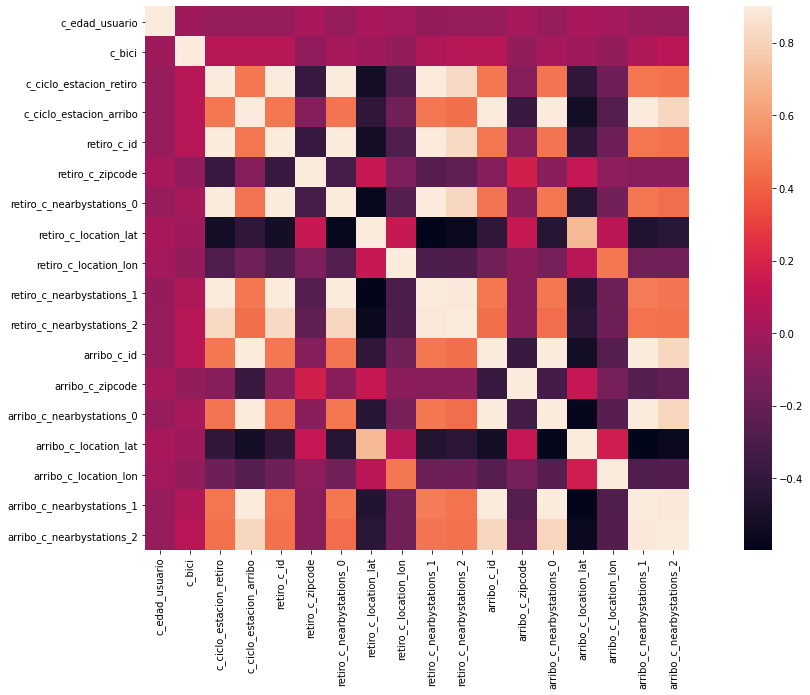

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns
corrmat = Xs.corr()
plt.subplots(figsize=(20, 10))
sns.heatmap(corrmat, vmax=.9, square=True)

In [114]:
Xs.head(2)

,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,c_ciclo_estacion_arribo,retiro_c_id,retiro_c_zipcode,retiro_c_nearbystations_0,retiro_c_location_lat,retiro_c_location_lon,retiro_c_nearbystations_1,retiro_c_nearbystations_2,arribo_c_id,arribo_c_zipcode,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_c_nearbystations_1,arribo_c_nearbystations_2
0,-0.376557,-0.796064,-1.272900,-0.327326,-1.272900,0.808596,-1.199785,0.716392,0.280155,-1.113592,-1.199094,-0.327326,-1.160861,-0.246560,0.005693,0.722115,-0.222721,-0.166721
1,-1.228277,-0.498731,-0.839819,-0.830977,-0.839819,0.687421,-0.797259,-0.254007,-0.138061,-0.773193,-0.684285,-0.830977,0.701672,-0.789719,-0.262355,-0.196408,-0.765597,-0.678150


# Modelado

In [115]:
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.utils import resample
from sklearn.model_selection import train_test_split

In [116]:
X_train, X_test = train_test_split(dfTrips, test_size=0.10, random_state=249)

In [117]:
X_test

,v_genero_usuario,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,d_fecha_retiro,d_hora_retiro,c_ciclo_estacion_arribo,d_fecha_arribo,d_hora_arribo,v_moment_of_day,retiro_c_id,retiro_t_name,retiro_t_address,retiro_c_zipcode,retiro_v_districtcode,retiro_v_districtname,retiro_c_nearbystations_0,retiro_c_location_lat,retiro_c_location_lon,retiro_v_stationtype,retiro_c_nearbystations_1,retiro_c_nearbystations_2,retiro_t_punto_geo,arribo_c_id,arribo_t_name,arribo_t_address,arribo_c_zipcode,arribo_v_districtcode,arribo_v_districtname,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_v_stationtype,arribo_c_nearbystations_1,arribo_c_nearbystations_2,arribo_t_punto_geo
251033,M,28.0,9313.0,69,2021-01-02,18:04:01,151,2021-01-02,18:10:29,noche,69.0,MICHOACAN-AMSTERDAM,MichoacánAmsterdam,6100.0,HIP,Hipódromo,70.0,19.410733,-99.168111,BIKE,76.0,77.0,"19.410733,-99.168111",151.0,CAMPECHE-TONALÁ,Campeche-Tonalá,0.0,ROM,Roma Sur,145.0,19.410529,-99.160873,BIKE,147.0,155.0,"19.410529,-99.160873"
364006,M,30.0,7711.0,367,2021-02-14,17:00:38,134,2021-02-14,17:23:06,tarde,367.0,BOSTON -AUGUSTO RODÍN,Boston -Augusto Rodín,3720.0,NBU,Noche Buena,362.0,19.379460,-99.181632,BIKE,363.0,366.0,"19.37946,-99.181632",134.0,ÁLVARO OBREGÓN-ORIZABA,Álvaro Obregón-Orizaba,0.0,R-N,Roma Norte,131.0,19.418304,-99.159560,"BIKE,TPV",136.0,137.0,"19.418304,-99.15956"
191205,F,39.0,11847.0,384,2021-01-23,15:21:30,363,2021-01-23,15:40:24,tarde,384.0,EMPRESA-POUSSIN,Empresa-Poussin,3920.0,INM,Insurgentes Mixcoac,385.0,19.375873,-99.185583,BIKE,386.0,417.0,"19.375873,-99.185583",363.0,HOLBEIN-PAULO UCELLO,Holbein-Paulo Ucello,3710.0,CDD,Ciudad de los Deportes,362.0,19.380813,-99.183851,BIKE,365.0,367.0,"19.380813,-99.183851"
90771,M,27.0,12258.0,32,2021-01-13,20:52:44,133,2021-01-13,21:02:42,noche,32.0,LONDRES-SEVILLA,LondresSevilla,6500.0,JUA,Juárez,22.0,19.422705,-99.169922,BIKE,38.0,39.0,"19.422705,-99.169922",133.0,COLIMA-MORELIA,Colima-Morelia,0.0,R-N,Roma Norte,130.0,19.421138,-99.154725,BIKE,132.0,135.0,"19.421138,-99.154725"
556736,M,29.0,11633.0,339,2021-03-03,07:37:23,339,2021-03-03,07:55:58,dia,339.0,ENRIQUE RÉBSAMEN-AVENIDA EUGENIA,Enrique Rébsamen-Avenida Eugenia,3020.0,NAR,Narvarte Poniente,322.0,19.386032,-99.160548,BIKE,340.0,343.0,"19.386032,-99.160548",339.0,ENRIQUE RÉBSAMEN-AVENIDA EUGENIA,Enrique Rébsamen-Avenida Eugenia,3020.0,NAR,Narvarte Poniente,322.0,19.386032,-99.160548,BIKE,340.0,343.0,"19.386032,-99.160548"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161149,F,46.0,6775.0,183,2021-01-24,22:36:54,112,2021-01-24,22:50:17,noche,183.0,GABINO BARRERA-GUILLERMO PRIETO,Gabino Barrera-Guillermo Prieto,0.0,S-R,San Rafael,160.0,19.437670,-99.164020,BIKE,174.0,255.0,"19.43767,-99.16402",112.0,AV. MORELOS-ABRAHAM GONZALEZ,Av. Morelos-Abraham González,6500.0,1,Ampliación Granada,98.0,19.432819,-99.151734,BIKE,113.0,114.0,"19.432819,-99.151734"
626254,M,52.0,10935.0,28,2021-10-03,02:49:37,115,2021-10-03,02:57:09,madrugada,28.0,TOLEDO-TOKIO,Toledo- Tokio,6500.0,JUA,Juárez,14.0,19.423542,-99.172494,BIKE,21.0,22.0,"19.423542,-99.172494",115.0,ROMA-DINAMARCA,Roma-Dinamarca,6500.0,JUA,Juárez,116.0,19.429947,-99.159698,BIKE,117.0,118.0,"19.429947,-99.159698"
149311,F,25.0,7790.0,96,2021-01-22,18:23:19,96,2021-01-22,18:47:04,noche,96.0,LOPEZ-AYUNTAMIENTO,López-Ayuntamiento,6500.0,CEN,Centro,98.0,19.430625,-99.142480,BIKE,0.0,0.0,"19.430625,-99.14248",96.0,LOPEZ-AYUNTAMIENTO,López-Ayuntamiento,6500.0,CEN,Centro,98.0,19.430625,-99.142480,BIKE,0.0,0.0,"19.430625,-99.14248"
546427,M,60.0,10759.0,211,2021-03-03,06:54:02,217,2021-03-03,06:57:15,dia,211.0,NEWTON-HORACIO,Newton-Horacio,11510.0,POL,Polanco,208.0,19.433607,-99.188528,BIKE,212.0,218.0,"19.433607,-99.188528",217.0,EULER-AV. HORACIO,Euler-Horacio,11510.0,POL,Polanco,207.0,19.432888,-99.183605,"BIKE,TPV",225.0,226.0,"19.432888,-99.183605"


In [118]:
# Obtener una muestra representativa de Xs
#Xs.sample(5, replace=True)
X_test_aux= X_test.filter(regex='c_')

    #filter(like='v_')

In [120]:
print(X_test_aux.shape)
X_test_aux.head(2)

(84074, 18)


,c_edad_usuario,c_bici,c_ciclo_estacion_retiro,c_ciclo_estacion_arribo,retiro_c_id,retiro_c_zipcode,retiro_c_nearbystations_0,retiro_c_location_lat,retiro_c_location_lon,retiro_c_nearbystations_1,retiro_c_nearbystations_2,arribo_c_id,arribo_c_zipcode,arribo_c_nearbystations_0,arribo_c_location_lat,arribo_c_location_lon,arribo_c_nearbystations_1,arribo_c_nearbystations_2
251033,28.0,9313.0,69,151,69.0,6100.0,70.0,19.410733,-99.168111,76.0,77.0,151.0,0.0,145.0,19.410529,-99.160873,147.0,155.0
364006,30.0,7711.0,367,134,367.0,3720.0,362.0,19.379460,-99.181632,363.0,366.0,134.0,0.0,131.0,19.418304,-99.159560,136.0,137.0


In [121]:
# PCA
pca =PCA(n_components=6) # segunda opción para incrementar el porcentaje de varianza explicada
#Xp = pd.DataFrame(pca.fit_transform(Xs),columns=['d1','d2','d3','d4','d5','d6','d7','d8','d9'])
#Xp = pd.DataFrame(pca.fit_transform(Xs),columns=['d1','d2','d3','d4','d5'])
Xp = pd.DataFrame(pca.fit_transform(X_test_aux),columns=['d1','d2','d3','d4','d5','d6'])
print(f'explained_variance_ratio_: {round(pca.explained_variance_ratio_.cumsum()[-1],4)*100}%')

explained_variance_ratio_: 99.97%


In [ ]:
# MDS 
mds = MDS(n_components=3)
Xm = pd.DataFrame(mds.fit_transform(X_test_aux),columns=['d1','d2','d3'])

In [86]:
# T-SNE
tsne = TSNE(n_components=3)
Xt = pd.DataFrame(tsne.fit_transform(X_test_aux),columns=['d1','d2','d3'])

explained_variance_ratio_: 72.95%


In [ ]:
# Gráficas de modelos: PCA y T-SNE
print('PCA')
Xp.iplot(kind='scatter',mode='markers',x='d1',y='d2',z='d3',color='blue')
#print('MDS')
#Xm.iplot(kind='scatter',mode='markers',x='d1',y='d2',color='blue')
print('TSNE')
Xt.iplot(kind='scatter',mode='markers',x='d1',y='d2',color='blue')

In [ ]:
# Cambio de tipo de variables categóricas (string) para efectos de modelado
df['v_generation'] = df['v_generation'].astype('str')
df['v_type_number'] = df['v_type_number'].astype('str')
df['v_abilities_number'] = df['v_abilities_number'].astype('str')
df['v_egg_type_number'] = df['v_egg_type_number'].astype('str')

In [ ]:
# Filtrado de las categóricas y graficado de los modelos
for col_selected in df.filter(like='v_'):
    print(col_selected)
    Xp=Xp.merge(df[col_selected],right_index=True,left_index=True).copy()    
    Xm=Xm.merge(df[col_selected],right_index=True,left_index=True).copy()
    Xt=Xt.merge(df[col_selected],right_index=True,left_index=True).copy()

    print('PCA')
    #Xp.iplot(kind='scatter',mode='markers',x='d1',y='d2',categories=col_selected)
    Xp.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected) # Grafica de PCA para categóricas
    #print('MDS')
    #Xm.sample(frac=frac).iplot(kind='scatter',mode='markers',x='d1',y='d2',categories=col_selected)
    Xm.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)
    print('TSNE')
    #Xt.sample(frac=frac).iplot(kind='scatter',mode='markers',x='d1',y='d2',categories=col_selected)
    Xt.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)

In [ ]:
# Dependencias requeridas para modelado
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE,MDS
from sklearn.cluster import AgglomerativeClustering,KMeans,DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

## K-means

**Inercia y silueta**

In [ ]:
l = []
m= []
for k in range(2,10):
    km = KMeans(n_clusters=k,max_iter=100)
    km.fit(Xs)
    l.append((k,km.inertia_))
    m.append((k,silhouette_score(Xs,km.predict(Xs))))
inercia = pd.DataFrame(l,columns=['k','inercia'])
silueta = pd.DataFrame(m,columns=['m','silueta'])

plot1 = plt.figure(1)
plt.title('SIlueta')
plt.plot(silueta['m'],silueta['silueta'],marker='o')
plot2 = plt.figure(2)
plt.title('Inercia')
plt.plot(inercia['k'],inercia['inercia'],marker='*')
plt.show()

**Clustering**

In [ ]:
k = 3
XsArr = np.array(Xs)

km = KMeans(n_clusters=k,max_iter=100)
km.fit(XsArr)
Xp['cl_kme']=Xm['cl_kme'] = Xt['cl_kme']=Xs['cl_kme'] = df['cl_kme'] = X['cl_kme'] =data['cl_kme'] = km.predict(Xs.filter(like='c_')).astype(str)

centroides = km.cluster_centers_
etiquetas = km.labels_

### Visualización en $\mathbb{R}^3$

In [ ]:
col_selected='cl_kme'
print('PCA')
Xp.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)
print('MDS')
Xm.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)
print('TSNE')
Xt.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)

## Perfilamiento

In [ ]:
data.groupby(by='cl_kme').agg(['mean'])

## Gausianos mixtos

In [ ]:
l = []
m=[]
for k in range(2,10):
    gmm = GaussianMixture(n_components=k,max_iter=2000)
    l.append((k,silhouette_score(Xs.filter(like='c'),gmm.fit_predict(Xs.filter(like='c')))))
    m.append((k,km.inertia_))
sil = pd.DataFrame(l,columns=['k','sil'])
sil.iplot('scatter',x='k',y='sil',color='blue')
ine = pd.DataFrame(m,columns=['n','ine'])
ine.iplot('scatter',x='n',y='ine',color='red')

**CLustering**

In [ ]:
k=3
gmm = GaussianMixture(n_components=k,)
Xp['cl_gm']=Xm['cl_gm'] = Xt['cl_gm'] =Xs['cl_gm'] = df['cl_gm'] = X['cl_gm'] =data['cl_gm']= gmm.fit_predict(Xs.filter(like='c_')).astype(str)
col_selected='cl_gm'
print('PCA')
Xp.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)
print('MDS')
Xm.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)
print('TSNE')
Xt.iplot(kind='scatter3d',mode='markers',x='d1',y='d2',z='d3',categories=col_selected)

## Perfilamiento

In [ ]:
data.groupby(by='cl_gm').agg(['mean'])